In [5]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
from os.path import join
import io

path_prefix = '../Agent-Map'

In [6]:
agent_df=pd.read_csv(join(path_prefix, "agent.csv"))

agent_df.head()

,AgentID,AgentX,AgentY,TimeInSeconds
0,39670,-171.891,-19.879,28903.5
1,39670,-163.132,-17.741,28904.9
2,39670,-156.743,-16.181,28906.0
3,39670,-156.743,-16.181,28907.2
4,44563,-181.220,-4.682,28938.0


In [7]:
building_df=pd.read_csv(join(path_prefix, "building.csv"))
building_df.head()

,BuildingID,BuildingX,BuildingY,DoorID,DoorX,DoorY
0,Sport Center,276.55,-56.71,SGM Door 1,267.732,-64.548
1,FMAN,-87.30,-42.50,FMAN Door 1,-128.022,-85.397
2,FMAN,-87.30,-42.50,FMAN Door 2,-153.030,-14.869
3,FMAN,-87.30,-42.50,FMAN Door 3,-40.920,-10.438
4,FMAN,-87.30,-42.50,FMAN Door 4,-35.755,-26.845


In [8]:
building_df.columns

Index(['BuildingID', ' BuildingX', ' BuildingY', ' DoorID', ' DoorX',
       ' DoorY'],
      dtype='object')

In [9]:
array=agent_df[ "AgentID"].unique()
array.size

2584

In [11]:
temp_df = agent_df.rename({" AgentX":" DoorX"," AgentY":" DoorY"}, axis='columns') 
temp_df.head()

##Merge için column isimlerş aynı olmalı diye burda gecici temp olarsk degistirdim

,AgentID,DoorX,DoorY,TimeInSeconds
0,39670,-171.891,-19.879,28903.5
1,39670,-163.132,-17.741,28904.9
2,39670,-156.743,-16.181,28906.0
3,39670,-156.743,-16.181,28907.2
4,44563,-181.220,-4.682,28938.0


In [12]:
int_df = pd.merge(temp_df,building_df,how="inner",on=[ " DoorX"," DoorY"])
print (int_df)
smt= int_df["AgentID"].unique()
smt.size

     AgentID    DoorX    DoorY   TimeInSeconds BuildingID   BuildingX  \
0      43561 -220.663   -3.839         30734.4       Yurt      -217.5   
1      38815 -220.663   -3.839         39186.2       Yurt      -217.5   
2      23787 -220.663   -3.839         40240.8       Yurt      -217.5   
3      20643 -220.663   -3.839         40661.0       Yurt      -217.5   
4      25695 -220.663   -3.839         43633.0       Yurt      -217.5   
..       ...      ...      ...             ...        ...         ...   
429    51382  -79.702  230.407         55300.9       FASS       -18.2   
430    23206  -40.920  -10.438         56210.5       FMAN       -87.3   
431    43838 -111.990  223.143         59283.5       FENS      -156.1   
432     7766 -128.022  -85.397         60117.9       FMAN       -87.3   
433    43176 -122.389  131.724         75046.8       FENS      -156.1   

      BuildingY       DoorID  
0         -31.9    UC Door 3  
1         -31.9    UC Door 3  
2         -31.9    UC Door 3  

402

In [13]:
agent_df.head()


,AgentID,AgentX,AgentY,TimeInSeconds
0,39670,-171.891,-19.879,28903.5
1,39670,-163.132,-17.741,28904.9
2,39670,-156.743,-16.181,28906.0
3,39670,-156.743,-16.181,28907.2
4,44563,-181.220,-4.682,28938.0


In [14]:
def DensityMap(stations, cnt_departure, cnt_arrival):
  Sabanci = [40.892781855938026, 29.377431512940387]
  
  map = folium.Map(location = Sabanci, 
                   zoom_start = 12, 
                   tiles = "CartoDB dark_matter")
  
  stations['Total Departure'] = cnt_departure
  stations['Total Arrival'] = cnt_arrival
  for index, row in stations.iterrows():
      net_departure = row['Total Departure'] - row['Total Arrival']
    
      _radius = np.abs(net_departure) 
      if np.isnan(_radius):
       _radius = 0
    
      if net_departure > 0:
       _color= '#E80018' # target red
      else:
       _color= '#81D8D0' # tiffany blue
  
      lat, lon = row['lat'], row['lon']
      _popup = '('+str(row['capacity'])+'/'+str(int(_radius))+') '+row['station_name']
  
      folium.CircleMarker(location = [lat,lon], 
                          radius = _radius, 
                          popup = _popup, 
                          color = _color, 
                          fill_opacity = 0.5).add_to(map)
  return map

In [15]:
pip install geopandas

     |████████████████████████████████| 962 kB 1.6 MB/s eta 0:00:01
     |████████████████████████████████| 1.0 MB 4.9 MB/s eta 0:00:01
     |████████████████████████████████| 14.8 MB 2.7 MB/s eta 0:00:01
     |████████████████████████████████| 7.4 MB 2.4 MB/s eta 0:00:01     |████████████████████████▌       | 5.7 MB 2.7 MB/s eta 0:00:01
Note: you may need to restart the kernel to use updated packages.


In [18]:
#import descartes
import geopandas as gpd
from shapely.geometry import Polygon,Point
%matplotlib inline
from scipy import ndimage

In [19]:
geometry=[Point(xy)for xy in zip(building_df[" BuildingX"],building_df[" BuildingY"])]
geometry[:3]

In [20]:
geo_df=gpd.GeoDataFrame(building_df, geometry=geometry)
geo_df.head()

,BuildingID,BuildingX,BuildingY,DoorID,DoorX,DoorY,geometry
0,Sport Center,276.55,-56.71,SGM Door 1,267.732,-64.548,POINT (276.550 -56.710)
1,FMAN,-87.30,-42.50,FMAN Door 1,-128.022,-85.397,POINT (-87.300 -42.500)
2,FMAN,-87.30,-42.50,FMAN Door 2,-153.030,-14.869,POINT (-87.300 -42.500)
3,FMAN,-87.30,-42.50,FMAN Door 3,-40.920,-10.438,POINT (-87.300 -42.500)
4,FMAN,-87.30,-42.50,FMAN Door 4,-35.755,-26.845,POINT (-87.300 -42.500)


[<shapely.geometry.point.Point object at 0x7fc8aa1f5e20>, <shapely.geometry.point.Point object at 0x7fc8aa1f5b50>, <shapely.geometry.point.Point object at 0x7fc8a9280670>, <shapely.geometry.point.Point object at 0x7fc8a9260c40>, <shapely.geometry.point.Point object at 0x7fc8a92609d0>, <shapely.geometry.point.Point object at 0x7fc8aa1f5fa0>, <shapely.geometry.point.Point object at 0x7fc8a9235940>, <shapely.geometry.point.Point object at 0x7fc8a9291e80>, <shapely.geometry.point.Point object at 0x7fc8acde9ca0>, <shapely.geometry.point.Point object at 0x7fc8acde9a30>, <shapely.geometry.point.Point object at 0x7fc8acde93d0>, <shapely.geometry.point.Point object at 0x7fc8acde9130>, <shapely.geometry.point.Point object at 0x7fc8acde92b0>, <shapely.geometry.point.Point object at 0x7fc8acde9280>, <shapely.geometry.point.Point object at 0x7fc8acde97c0>, <shapely.geometry.point.Point object at 0x7fc8acde9fd0>, <shapely.geometry.point.Point object at 0x7fc8aa202070>, <shapely.geometry.point.Point 

<AxesSubplot:>

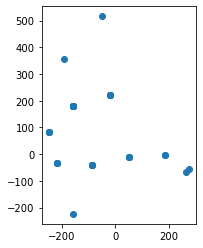

In [21]:
print (geometry)
geo_df.plot()


In [22]:
def heatmap(d, bins=(100,100), smoothing=1.3, cmap='jet'):
    def getx(pt):
        return pt.coords[0][0]

    def gety(pt):
        return pt.coords[0][1]

    x = list(d.geometry.apply(getx))
    y = list(d.geometry.apply(gety))
    heatmap, xedges, yedges = np.histogram2d(y, x, bins=bins)
    extent = [yedges[0], yedges[-1], xedges[-1], xedges[0]]

    logheatmap = np.log(heatmap)
    logheatmap[np.isneginf(logheatmap)] = 0
    logheatmap = ndimage.filters.gaussian_filter(logheatmap, smoothing, mode='nearest')
    
    plt.imshow(logheatmap, cmap=cmap, extent=extent)
    plt.colorbar()
    plt.gca().invert_yaxis()
    plt.show()

<ipython-input-22-ad95acce9948>:13: RuntimeWarning: divide by zero encountered in log
  logheatmap = np.log(heatmap)


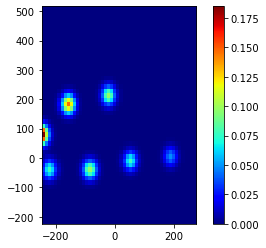

In [23]:
heatmap(geo_df, bins=50, smoothing=1.5)

In [24]:
geometry2=[Point(xy)for xy in zip(agent_df[" AgentX"],agent_df[" AgentY"])]
geometry2[:3]

In [25]:
geo_df2=gpd.GeoDataFrame(agent_df, geometry=geometry2)
geo_df2.head()

,AgentID,AgentX,AgentY,TimeInSeconds,geometry
0,39670,-171.891,-19.879,28903.5,POINT (-171.891 -19.879)
1,39670,-163.132,-17.741,28904.9,POINT (-163.132 -17.741)
2,39670,-156.743,-16.181,28906.0,POINT (-156.743 -16.181)
3,39670,-156.743,-16.181,28907.2,POINT (-156.743 -16.181)
4,44563,-181.220,-4.682,28938.0,POINT (-181.220 -4.682)


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



<AxesSubplot:>

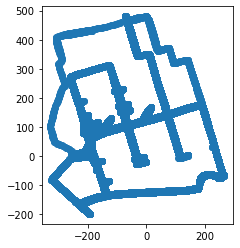

In [26]:
print (geometry2)
geo_df2.plot()

<ipython-input-22-ad95acce9948>:13: RuntimeWarning: divide by zero encountered in log
  logheatmap = np.log(heatmap)


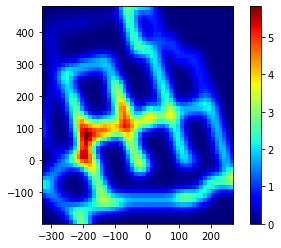

In [27]:
heatmap(geo_df2, bins=50, smoothing=1.5)

In [28]:
agent_df[" TimeInSeconds"]



0         28903.5
1         28904.9
2         28906.0
3         28907.2
4         28938.0
           ...   
414705    84725.7
414706    84726.5
414707    84727.5
414708    84728.3
414709    84729.3
Name:  TimeInSeconds, Length: 414710, dtype: float64

In [29]:
def time_categorizer(time):
  if time < 43200:  #time until noon 12pm
        return "Morning"
  elif 43200 <= time < 61200:    #time between 12pm-5pm 
      return "Afternoon"
  elif 61200 <= time < 75600:   #time between 5-9pm Evening
      return "Evening"
  else:
      return "Night"



agent_df["TimeOfDay"] = agent_df[" TimeInSeconds"].apply(time_categorizer)
#agent_df["TimeOfDay"].count().plot(kind="hist", bins=8, rwidth=0.8) #also can plot histogram
print(agent_df["TimeOfDay"] , agent_df[" TimeInSeconds"])

0         Morning
1         Morning
2         Morning
3         Morning
4         Morning
           ...   
414705      Night
414706      Night
414707      Night
414708      Night
414709      Night
Name: TimeOfDay, Length: 414710, dtype: object 0         28903.5
1         28904.9
2         28906.0
3         28907.2
4         28938.0
           ...   
414705    84725.7
414706    84726.5
414707    84727.5
414708    84728.3
414709    84729.3
Name:  TimeInSeconds, Length: 414710, dtype: float64


In [30]:
agent_df.head(100000)

,AgentID,AgentX,AgentY,TimeInSeconds,geometry,TimeOfDay
0,39670,-171.891,-19.879,28903.5,POINT (-171.891 -19.879),Morning
1,39670,-163.132,-17.741,28904.9,POINT (-163.132 -17.741),Morning
2,39670,-156.743,-16.181,28906.0,POINT (-156.743 -16.181),Morning
3,39670,-156.743,-16.181,28907.2,POINT (-156.743 -16.181),Morning
4,44563,-181.220,-4.682,28938.0,POINT (-181.220 -4.682),Morning
...,...,...,...,...,...,...
99995,16810,-213.860,-181.591,44200.4,POINT (-213.860 -181.591),Afternoon
99996,22691,-203.025,139.008,44201.7,POINT (-203.025 139.008),Afternoon
99997,44783,-37.087,115.767,44201.7,POINT (-37.087 115.767),Afternoon
99998,27907,-183.469,-11.936,44201.7,POINT (-183.469 -11.936),Afternoon


In [33]:
pip install folium

     |████████████████████████████████| 93 kB 1.1 MB/s eta 0:00:01
Note: you may need to restart the kernel to use updated packages.


In [76]:
location2 = agent_df[[" AgentX", " AgentY"]].dropna(how="any").values

from folium.plugins import HeatMap

Sabanci = [40.892781855938026, 29.377431512940387]
folium_map = folium.Map(location=Sabanci,
                        zoom_start=15)
marker = folium.CircleMarker(location=Sabanci)
marker.add_to(folium_map)

mapnew=HeatMap(location2).add_to(folium_map)

folium_map


In [77]:
agent_df.head()

,AgentID,AgentX,AgentY,TimeInSeconds,geometry,TimeOfDay
0,39670,-171.891,-19.879,28903.5,POINT (-171.891 -19.879),Morning
1,39670,-163.132,-17.741,28904.9,POINT (-163.132 -17.741),Morning
2,39670,-156.743,-16.181,28906.0,POINT (-156.743 -16.181),Morning
3,39670,-156.743,-16.181,28907.2,POINT (-156.743 -16.181),Morning
4,44563,-181.220,-4.682,28938.0,POINT (-181.220 -4.682),Morning


In [ ]:
count=0 
for x in agent_df["TimeOfDay"]:
    if agent_df["TimeOfDay"]=="Morning" and agent_df[]:
        count=count+1

In [85]:
morning_df = agent_df.loc[agent_df["TimeOfDay"] == "Morning"]
morning_df

,AgentID,AgentX,AgentY,TimeInSeconds,geometry,TimeOfDay
0,39670,-171.891,-19.879,28903.5,POINT (-171.891 -19.879),Morning
1,39670,-163.132,-17.741,28904.9,POINT (-163.132 -17.741),Morning
2,39670,-156.743,-16.181,28906.0,POINT (-156.743 -16.181),Morning
3,39670,-156.743,-16.181,28907.2,POINT (-156.743 -16.181),Morning
4,44563,-181.220,-4.682,28938.0,POINT (-181.220 -4.682),Morning
...,...,...,...,...,...,...
91138,44679,60.043,138.423,43199.9,POINT (60.043 138.423),Morning
91139,23967,-194.493,45.507,43199.9,POINT (-194.493 45.507),Morning
91140,49515,12.246,160.579,43199.9,POINT (12.246 160.579),Morning
91141,46512,-192.440,62.520,43199.9,POINT (-192.440 62.520),Morning


In [87]:
def time_categorizer(time):
  if time < 43200:  #time until noon 12pm
        return "Morning"
  elif 43200 <= time < 61200:    #time between 12pm-5pm 
      return "Afternoon"
  elif 61200 <= time < 75600:   #time between 5-9pm Evening
      return "Evening"
  else:
      return "Night"



int_df["TimeOfDay"] = int_df[" TimeInSeconds"].apply(time_categorizer)
#agent_df["TimeOfDay"].count().plot(kind="hist", bins=8, rwidth=0.8) #also can plot histogram
print(int_df["TimeOfDay"] , int_df[" TimeInSeconds"])

0        Morning
1        Morning
2        Morning
3        Morning
4      Afternoon
         ...    
429    Afternoon
430    Afternoon
431    Afternoon
432    Afternoon
433      Evening
Name: TimeOfDay, Length: 434, dtype: object 0      30734.4
1      39186.2
2      40240.8
3      40661.0
4      43633.0
        ...   
429    55300.9
430    56210.5
431    59283.5
432    60117.9
433    75046.8
Name:  TimeInSeconds, Length: 434, dtype: float64


In [88]:
morning_int_df = int_df.loc[int_df["TimeOfDay"] == "Morning"]
morning_int_df 

,AgentID,DoorX,DoorY,TimeInSeconds,BuildingID,BuildingX,BuildingY,DoorID,TimeOfDay
0,43561,-220.663,-3.839,30734.4,Yurt,-217.5,-31.9,UC Door 3,Morning
1,38815,-220.663,-3.839,39186.2,Yurt,-217.5,-31.9,UC Door 3,Morning
2,23787,-220.663,-3.839,40240.8,Yurt,-217.5,-31.9,UC Door 3,Morning
3,20643,-220.663,-3.839,40661.0,Yurt,-217.5,-31.9,UC Door 3,Morning
29,24135,-193.569,118.111,31606.1,FENS,-156.1,181.0,FENS Door 3,Morning
40,55018,-64.592,180.326,32847.9,FASS,-18.2,219.6,FASS Door 2,Morning
41,40828,-64.592,180.326,35572.2,FASS,-18.2,219.6,FASS Door 2,Morning
42,43408,-64.592,180.326,42494.7,FASS,-18.2,219.6,FASS Door 2,Morning
47,44502,-224.252,13.868,33594.7,UM,-248.7,84.6,UC Door 3,Morning
48,20173,-224.252,13.868,42232.2,UM,-248.7,84.6,UC Door 3,Morning


In [94]:
afternoon_int_df = int_df.loc[int_df["TimeOfDay"] == "Afternoon"]
afternoon_int_df 

,AgentID,DoorX,DoorY,TimeInSeconds,BuildingID,BuildingX,BuildingY,DoorID,TimeOfDay
4,25695,-220.663,-3.839,43633.0,Yurt,-217.5,-31.9,UC Door 3,Afternoon
5,37837,-220.663,-3.839,44538.3,Yurt,-217.5,-31.9,UC Door 3,Afternoon
6,23378,-220.663,-3.839,45484.5,Yurt,-217.5,-31.9,UC Door 3,Afternoon
7,40070,-220.663,-3.839,46038.5,Yurt,-217.5,-31.9,UC Door 3,Afternoon
8,31905,-220.663,-3.839,46631.0,Yurt,-217.5,-31.9,UC Door 3,Afternoon
...,...,...,...,...,...,...,...,...,...
426,30942,-89.640,150.768,56595.4,FENS,-156.1,181.0,FENS Door 6,Afternoon
429,51382,-79.702,230.407,55300.9,FASS,-18.2,219.6,FASS Door 3,Afternoon
430,23206,-40.920,-10.438,56210.5,FMAN,-87.3,-42.5,FMAN Door 3,Afternoon
431,43838,-111.990,223.143,59283.5,FENS,-156.1,181.0,FENS Door 8,Afternoon


In [95]:
evening_int_df = int_df.loc[int_df["TimeOfDay"] == "Evening"]
evening_int_df 

,AgentID,DoorX,DoorY,TimeInSeconds,BuildingID,BuildingX,BuildingY,DoorID,TimeOfDay
20,25713,-220.663,-3.839,62541.9,Yurt,-217.50,-31.90,UC Door 3,Evening
21,23954,-220.663,-3.839,62965.4,Yurt,-217.50,-31.90,UC Door 3,Evening
22,51509,-220.663,-3.839,63009.3,Yurt,-217.50,-31.90,UC Door 3,Evening
23,26521,-220.663,-3.839,63066.1,Yurt,-217.50,-31.90,UC Door 3,Evening
24,25560,-220.663,-3.839,63249.9,Yurt,-217.50,-31.90,UC Door 3,Evening
...,...,...,...,...,...,...,...,...,...
422,40540,267.732,-64.548,66600.3,Sport Center,276.55,-56.71,SGM Door 1,Evening
423,51677,267.732,-64.548,66721.3,Sport Center,276.55,-56.71,SGM Door 1,Evening
427,58087,-89.640,150.768,66164.5,FENS,-156.10,181.00,FENS Door 6,Evening
428,16763,-89.640,150.768,74700.3,FENS,-156.10,181.00,FENS Door 6,Evening


In [96]:
night_int_df = int_df.loc[int_df["TimeOfDay"] == "Night"]
night_int_df 

,AgentID,DoorX,DoorY,TimeInSeconds,BuildingID,BuildingX,BuildingY,DoorID,TimeOfDay
38,21110,-193.569,118.111,78387.8,FENS,-156.10,181.00,FENS Door 3,Night
39,44825,-193.569,118.111,81791.2,FENS,-156.10,181.00,FENS Door 3,Night
83,25172,-153.030,-14.869,78738.8,FMAN,-87.30,-42.50,FMAN Door 2,Night
84,17276,-153.030,-14.869,80763.3,FMAN,-87.30,-42.50,FMAN Door 2,Night
85,17466,-153.030,-14.869,82951.1,FMAN,-87.30,-42.50,FMAN Door 2,Night
313,32669,-35.755,-26.845,75825.7,FMAN,-87.30,-42.50,FMAN Door 4,Night
314,45729,-35.755,-26.845,75849.3,FMAN,-87.30,-42.50,FMAN Door 4,Night
315,43388,-35.755,-26.845,75852.1,FMAN,-87.30,-42.50,FMAN Door 4,Night
316,19560,-35.755,-26.845,76311.1,FMAN,-87.30,-42.50,FMAN Door 4,Night
317,23954,-35.755,-26.845,76423.1,FMAN,-87.30,-42.50,FMAN Door 4,Night


In [98]:
frequent_building_morning = morning_int_df['BuildingID'].value_counts().idxmax()
print("Most frequently visited building in morning ",frequent_building_morning)
frequent_door_morning = morning_int_df[' DoorID'].value_counts().idxmax()
print("Most frequently used door in morning ",frequent_door_morning)

print ("")
frequent_building_afternoon = afternoon_int_df['BuildingID'].value_counts().idxmax()
print("Most frequently visited building in afternoon ",frequent_building_afternoon)
frequent_door_afternoon = afternoon_int_df[' DoorID'].value_counts().idxmax()
print("Most frequently used door in afternoon ",frequent_door_afternoon)

print ("")

frequent_building_evening = evening_int_df['BuildingID'].value_counts().idxmax()
print("Most frequently visited building in evening ",frequent_building_evening)
frequent_door_evening = evening_int_df[' DoorID'].value_counts().idxmax()
print("Most frequently used door in evening ",frequent_door_evening)

print ("")

frequent_building_night = night_int_df['BuildingID'].value_counts().idxmax()
print("Most frequently visited building at night ",frequent_building_night)
frequent_door_night = night_int_df[' DoorID'].value_counts().idxmax()
print("Most frequently used door at night ",frequent_door_night)


Most frequently visited building in morning  FMAN
Most frequently used door in morning  FMAN Door 4

Most frequently visited building in afternoon  FMAN
Most frequently used door in afternoon  FMAN Door 4

Most frequently visited building in evening  FMAN
Most frequently used door in evening  FMAN Door 4

Most frequently visited building at night  FMAN
Most frequently used door at night  FMAN Door 4
